# AusStage symposium

<style>
  a {
    color: #1ea5a6 !important;
  }
</style>

The work presented below form part of ACDE's presentation at the AusStage Symposium in March 2023.

- We focus on the intersection of artists found across three main datasets: DAAO, AusStage and IMDb.
- From here we explore four case studies to better understand the nuances of the overlap.

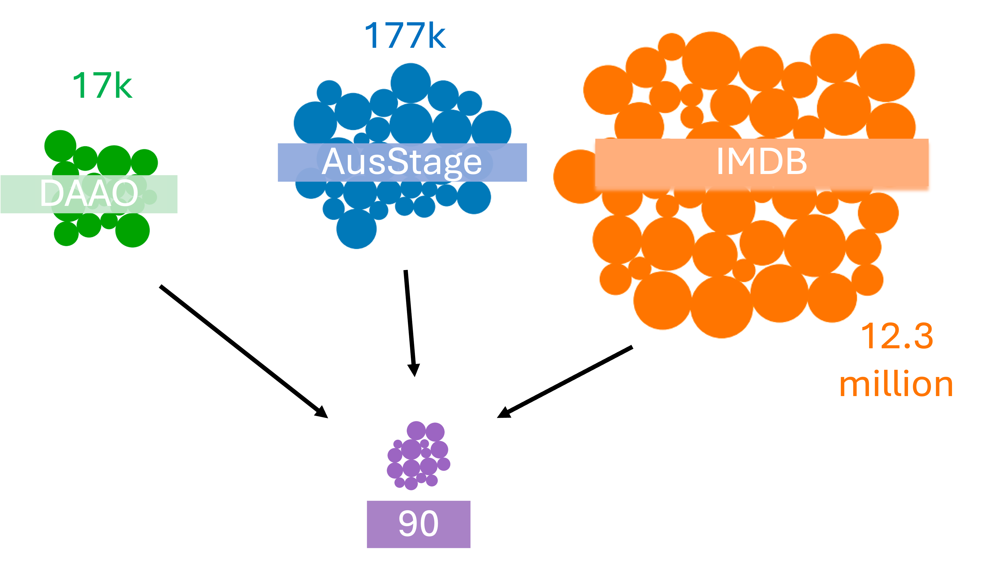

In [21]:
from IPython.display import Image
Image(filename='images/Intersection.png')

### Import packages

In [43]:
import numpy as np
import pandas as pd
import json
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='white', context='paper')

# with open('data/DAAO_AusStage_NameMatching_Details_202302281120.json') as f:
#     data = json.load(f)

# acde_df = pd.DataFrame(data)

# # read data file with .tsv extension
# imdb_df = pd.read_csv('data/name.basics.tsv', sep='\t')

# # read data file with .tsv extension
# imdb_titleakas_df = pd.read_csv('data/title.akas.tsv', sep='\t')

# # read data file with .tsv extension
# imdb_titlebasics_df = pd.read_csv('data/title.basics.tsv', sep='\t')

# exact_matches = pd.DataFrame()

# for idx,x in enumerate(acde_df['display_name_ausstage'].unique()):
#     if idx % 25 == 0: print(idx)
#     x2 = x.strip().replace('  ',' ')
#     this_person = imdb_df[imdb_df['primaryName'] == x2].copy()
#     if this_person.shape[0] == 1: 
#         this_person['display_name_ausstage'] = x 
#         exact_matches = pd.concat([exact_matches, this_person], axis=0)

# acde_imdb_merged = pd.merge(acde_df, exact_matches, on='display_name_ausstage')
# print(acde_imdb_merged['display_name_ausstage'].nunique())
# print(acde_imdb_merged['gender_daao'].value_counts(),'\n\n', acde_imdb_merged['gender_ausstage'].value_counts())

# write to csv
# acde_imdb_merged.to_csv('data/ausstage_march_symp_exact.csv', index=False)

# # Anomalies identified with gender records

# # remove Pat Oliphant - appears to be two different people
# acde_imdb_merged = acde_imdb_merged[acde_imdb_merged['display_name_ausstage'] != 'Pat Oliphant']

# # update Toni Maticevski - same person but listed as female in AusStage?
# acde_imdb_merged.loc[acde_imdb_merged['display_name_ausstage'] == 'Toni Maticevski','gender_ausstage'] = 'Male'

# # update Brook Andrew - same person but listed as female in AusStage?
# acde_imdb_merged.loc[acde_imdb_merged['display_name_ausstage'] == 'Brook Andrew','gender_ausstage'] = 'Male'

# # update Bonita Ely - listed as Unknown in AusStage
# acde_imdb_merged.loc[acde_imdb_merged['display_name_ausstage'] == 'Bonita Ely','gender_ausstage'] = 'Female'

# # update J. Wright - listed as Unknown in AusStage
# acde_imdb_merged.loc[acde_imdb_merged['display_name_ausstage'] == 'J. Wright','gender_ausstage'] = 'Male'

# # we identified some mismatches - these are not the same person
# nonmatches_names = ['Raymond Arnold','Janet Dawson','Syd Miller','Eileen Cook', 'Lauren Berkowitz']
# acde_imdb_merged = acde_imdb_merged[~acde_imdb_merged['display_name_ausstage']\
#                                               .isin(nonmatches_names)]

# # we omit rows with no record knownForTitles data
# acde_imdb_merged = acde_imdb_merged[acde_imdb_merged['knownForTitles'] != '\\N']
# print(acde_imdb_merged['gender_daao'].value_counts(),'\n\n', acde_imdb_merged['gender_ausstage'].value_counts())


# acde_imdb_expanded = acde_imdb_merged.assign(titleId=acde_imdb_merged['knownForTitles']\
#     .str.split(',')).explode('titleId').reset_index(drop=True)

# acde_imdb_withtitles = pd.merge(acde_imdb_expanded, imdb_titleakas_df, on='titleId')
# acde_imdb_withtitles2 = pd.merge(acde_imdb_withtitles, imdb_titlebasics_df, 
#                                 left_on='titleId', right_on='tconst')

# nonmatches_names = ['Raymond Arnold','Janet Dawson','Syd Miller','Eileen Cook', 'Lauren Berkowitz']
# acde_imdb_withtitles2 = acde_imdb_withtitles2[~acde_imdb_withtitles2['display_name_ausstage']\
#                                               .isin(nonmatches_names)]


### George Gittoes

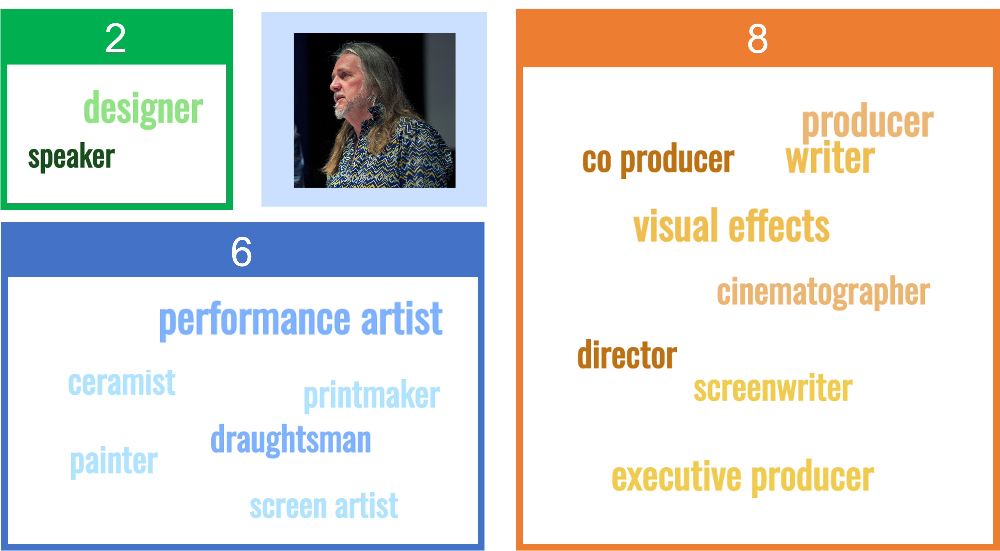

In [22]:
Image(filename='images/George.png')

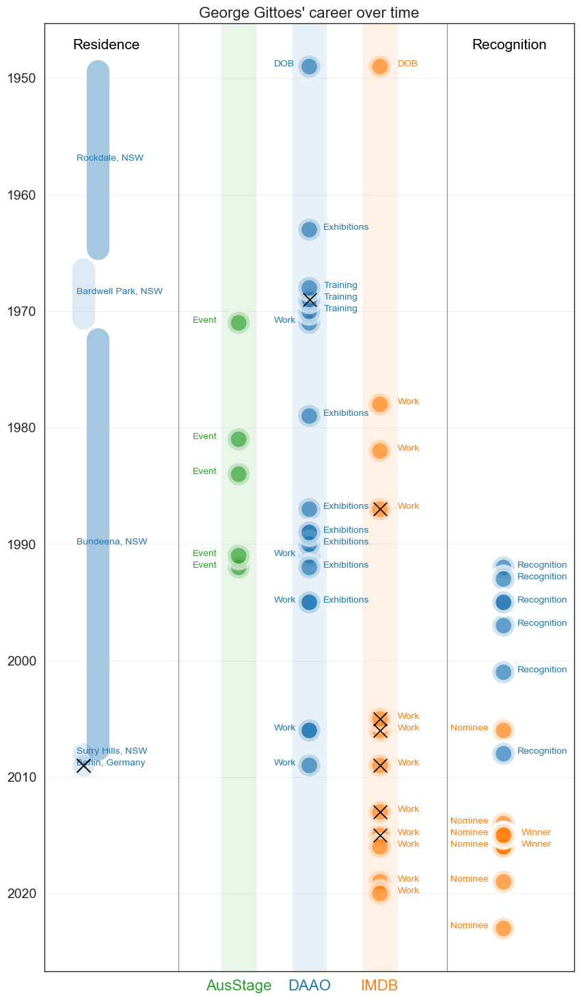

In [18]:
george_df = pd.read_csv('data/selected4_events.csv')

# change values with birth date to 'Birth'
george_df['Type'] = np.where(george_df['Type'] == 'Birth date', 'DOB', george_df['Type'])
# george_df['Event'] = np.where(george_df['Event'] == 'Berlin, Germany', 'Berlin, \nGermany', george_df['Event'])

george_df = george_df[george_df.Person == 'George Gittoes'] 
g1 = george_df.copy()

ausstage = george_df[george_df.Dataset == 'AusStage'].reset_index(drop=True)
daao = george_df[george_df.Dataset == 'DAAO'].reset_index(drop=True)
imdb = george_df[george_df.Dataset == 'IMDB'].reset_index(drop=True)

g1 = g1[g1.Type != 'Residence']
g1_awards = g1[(g1.Type == 'Recognition') | (g1.Type == 'Winner') | (g1.Type == 'Nominee')]
g1 = g1[g1.Type != 'Winner']
g1 = g1[g1.Type != 'Nominee']
g1 = g1[g1.Type != 'Recognition']

fig, ax = plt.subplots(figsize=(10,18))
sns.scatterplot(data=g1.sort_values(['Dataset'], ascending=[True]),
x='Dataset', y='Start', hue='Dataset', ax=ax, s=550, alpha=0.7, linewidth=7,
palette=['tab:green','tab:blue','tab:orange'], legend=False)

plt.scatter(data=g1[(g1.Country != 'Australia') & (~g1.Country.isnull())].sort_values(['Dataset'], ascending=[True]),
            x='Dataset',y='Start', marker='x', color='black', s=200, zorder=10)

# change x-axis labels to be different colors
for label in ax.get_xticklabels():
    dataset_label = label.get_text()
    if dataset_label == 'AusStage': label.set_color('tab:green')
    elif dataset_label == 'DAAO': label.set_color('tab:blue')
    elif dataset_label == 'IMDB': label.set_color('tab:orange')

sns.scatterplot(data=g1_awards[g1_awards.Type != 'Recognition'].sort_values(['Dataset'], ascending=[True]),
x=3.75, y='Start', hue='Dataset', ax=ax, s=550, alpha=0.7, palette=['tab:orange'], legend=True,linewidth=7)

sns.scatterplot(data=g1_awards[g1_awards.Type == 'Recognition'].sort_values(['Dataset'], ascending=[True]),
x=3.75, y='Start', hue='Dataset', ax=ax, s=550, alpha=0.7, palette=['tab:blue'], legend=True, linewidth=7)

plt.legend(loc='lower left', fontsize=14, ncol=2, facecolor='white')
# for i in range(6): plt.gca().get_legend().legendHandles[i]._sizes = [200]

# make y-axis labels larger
plt.yticks(fontsize=14); plt.xticks(fontsize=16)
plt.ylabel(''); plt.xlabel('')

# add y-axis grid
plt.grid(axis='y', alpha=0.3)

# add a title
plt.title("George Gittoes' career over time" , fontsize=16)

# add higlighted rectangles centered at 0
plt.axvspan(-0.25, 0.25, facecolor='tab:green', alpha=0.1)
plt.axvspan(0.75, 1.25, facecolor='tab:blue', alpha=0.1)
plt.axvspan(1.75, 2.25, facecolor='tab:orange', alpha=0.1)


# add vertical line
# add a horizontal line  between the start and end of each person's career
for idx,p in enumerate(daao[daao['Type'] == 'Residence'].sort_values('Start')['Event'].unique()):
    start = daao[(daao['Event']==p)]['Start'].min()
    end = daao[(daao['Event']==p)]['End'].max()
    if (start==end) | (start+1==end): 
        
        sns.scatterplot(data=daao[daao['Event']==p].sort_values(['Start'], ascending=[True]),
        x=-2.2, y='Start',hue='Event', ax=ax, s=550, alpha=0.15, palette=['tab:blue'], legend=False)

        plt.scatter(data=daao[(daao['Event']==p) & (daao.Country != 'Australia') & (~daao.Country.isnull())].sort_values(['Start'], ascending=[True]),
            x=-2.2,y=2009, marker='x', color='black', s=200, zorder=10)
        
    else:
        if idx % 2 == 0: plt.plot([-2,-2], [start+0.4, end-0.4], linewidth=24, zorder=0, color = 'tab:blue', alpha=0.4)
        else: plt.plot([-2.2,-2.2], [start+0.4, end-0.4], linewidth=24, zorder=0, color = 'tab:blue', alpha=0.15)


# add annottation above the vertical line
plt.annotate('Residence', (-2.35, g1['Start'].min()-1.5), fontsize=15, alpha=1, color='black')


# add annottation above the vertical line
plt.annotate('Recognition', (3.3, g1['Start'].min()-1.5), fontsize=15, alpha=1, color='black')


# add text labels for each Residence event
for idx,p in enumerate(daao[daao['Type'] == 'Residence'].sort_values('Start')['Event'].unique()):
    start = daao[(daao['Event']==p)]['Start'].min()
    end = daao[(daao['Event']==p)]['End'].max()
    if (start==end) | (start+1==end): 
        ax.annotate(p, (-2.3, start), fontsize=10, alpha=1, color='tab:blue')
    else:
        if idx % 2 == 0: ax.annotate(p, (-2.3, (start+end)/2), fontsize=10, alpha=1, color='tab:blue')
        else: ax.annotate(p, (-2.3, (start+end)/2), fontsize=10, alpha=1, color='tab:blue')

daao = daao[daao.Type != 'Residence']

for idx,x in enumerate(ausstage['Type']):
    y = ausstage[ausstage.Type.str.contains(x)]['Start'][idx]
    ax.annotate(x, (-.65, y), fontsize=10, alpha=1, color='tab:green')

for idx,x in enumerate(daao['Type'].unique()):
    y = george_df[(george_df.Dataset == 'DAAO') & (george_df.Type.str.contains(x))]['Start'].unique()
    for y in george_df[(george_df.Dataset == 'DAAO') & (george_df.Type.str.contains(x))]['Start'].unique():
        z = george_df[(george_df.Dataset == 'DAAO') & (george_df.Type.str.contains(x)) & (george_df.Start == y)]['Start'].iloc[0]
        if (x == 'Recognition'): ax.annotate(x, (3.95, z), fontsize=10, alpha=1, color='tab:blue')
        else:
            if idx % 2 == 0: ax.annotate(x, (0.5, z), fontsize=10, alpha=1, color='tab:blue')
            else: ax.annotate(x, (1.2, z), fontsize=10, alpha=1, color='tab:blue')

for idx,x in enumerate(imdb['Type'].unique()):
    y = george_df[(george_df.Dataset == 'IMDB') & (george_df.Type.str.contains(x))]['Start'].unique()
    for y in george_df[(george_df.Dataset == 'IMDB') & (george_df.Type.str.contains(x))]['Start'].unique():
        z = george_df[(george_df.Dataset == 'IMDB') & (george_df.Type.str.contains(x)) & (george_df.Start == y)]['Start'].iloc[0]
        if (x == 'Nominee'): ax.annotate(x, (3, z), fontsize=10, alpha=1, color='tab:orange')
        elif (x == 'Winner'): ax.annotate(x, (4, z), fontsize=10, alpha=1, color='tab:orange')
        else:
            ax.annotate(x, (2.25, z), fontsize=10, alpha=1, color='tab:orange')

# change the order of the y-axis
plt.gca().invert_yaxis()

# add more space between the x-axis ticks
plt.xticks(np.arange(0, 10, 1))

# move legend to specific location
# plt.legend(loc='upper right', fontsize=12, ncol=1, facecolor='white', bbox_to_anchor=(0.965, 0.97))
# for i in range(2): plt.gca().get_legend().legendHandles[i]._sizes = [200]

# remove the legend
plt.legend().remove()

# add vertical lines on 0,1,2
plt.axvline(x=-.85, color='black', alpha=0.4, linestyle='-', linewidth=1)
plt.axvline(x=2.95, color='black', alpha=0.4, linestyle='-', linewidth=1)
# plt.axvline(x=0, color='lightgrey', alpha=0.4, linestyle='-', linewidth=1)
# plt.axvline(x=1, color='lightgrey', alpha=0.4, linestyle='-', linewidth=1)
# plt.axvline(x=2, color='lightgrey', alpha=0.4, linestyle='-', linewidth=1)

# # add annotation top right of plot to denote the vertical lines
# plt.annotate('| = annual break', xy=(2006.5, -.5), fontsize=12, alpha=0.5)

#remove y-axis title
plt.ylabel('')

# increase y-axis limits to make room for the title
plt.xlim(-2.75, 4.75)

plt.show()


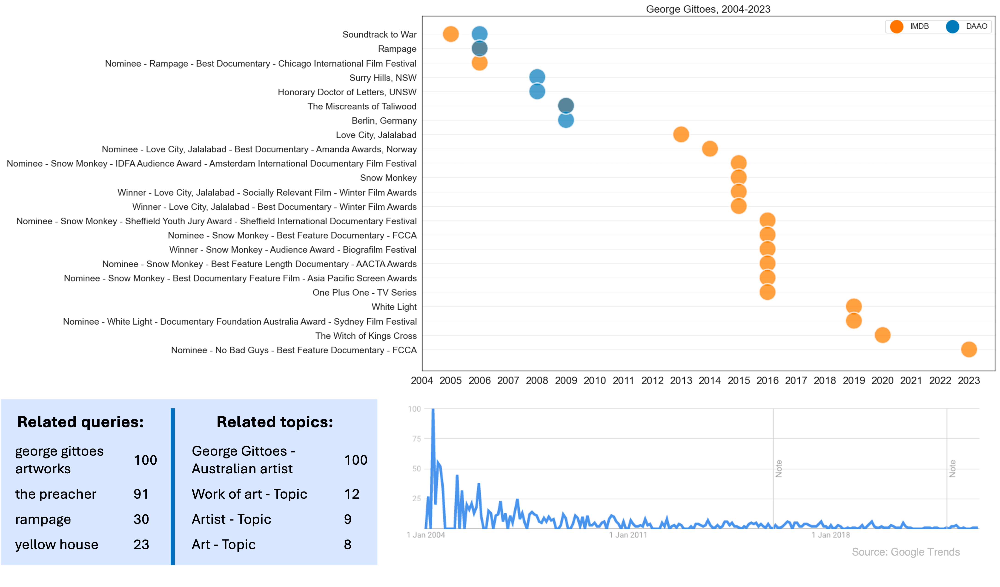

In [23]:
# fig, ax = plt.subplots(figsize=(16,10))
# sns.scatterplot(data=george_df[george_df['Start'] >= 2004].sort_values('Start'),
# x='Start', y='Event', 
# hue='Dataset', ax=ax, s=700, alpha=0.7, palette=['tab:orange','tab:blue','tab:orange'])

# plt.legend(loc='lower left', fontsize=14, ncol=2, facecolor='white')
# # for i in range(6): plt.gca().get_legend().legendHandles[i]._sizes = [200]

# # make y-axis labels larger
# plt.yticks(fontsize=14); plt.xticks(fontsize=16)
# plt.ylabel(''); plt.xlabel('')

# # add y-axis grid
# plt.grid(axis='y', alpha=0.3)

# # add a title
# plt.title('George Gittoes, 2004-2023' , fontsize=16)

# # # add annotation top right of plot to denote the vertical lines
# # plt.annotate('| = annual break', xy=(2006.5, -.5), fontsize=12, alpha=0.5)

# # move legend to specific location
# plt.legend(loc='upper right', fontsize=12, ncol=2, facecolor='white')
# for i in range(2): plt.gca().get_legend().legendHandles[i]._sizes = [400]

# # show each year on x-acis
# plt.xticks(np.arange(2004, 2024, 1))

# # increase y-axis limits to make room for the title
# plt.ylim(23.5, -1.25)

# plt.show()

Image(filename='images/George_Trends.png')

### Bonita Ely

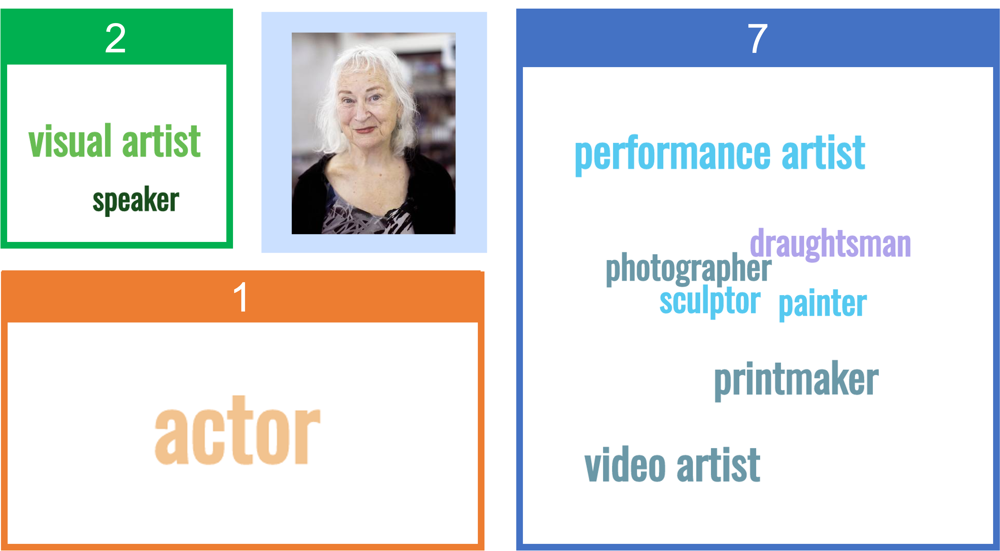

In [25]:
Image(filename='images/bonita_ely.png')

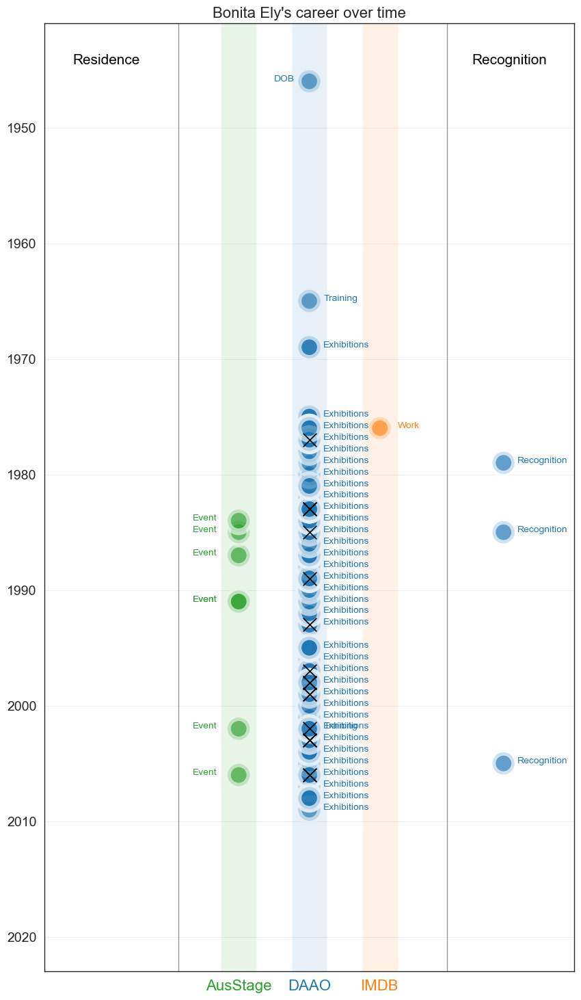

In [40]:
import warnings
warnings.filterwarnings('ignore')

george_df = pd.read_csv('data/selected4_events.csv')

# change values with birth date to 'Birth'
george_df['Type'] = np.where(george_df['Type'] == 'Birth date', 'DOB', george_df['Type'])
# george_df['Event'] = np.where(george_df['Event'] == 'Berlin, Germany', 'Berlin, \nGermany', george_df['Event'])

george_df = george_df[george_df.Person == 'Bonita Ely'] 
g1 = george_df.copy()

ausstage = george_df[george_df.Dataset == 'AusStage'].reset_index(drop=True)
daao = george_df[george_df.Dataset == 'DAAO'].reset_index(drop=True)
imdb = george_df[george_df.Dataset == 'IMDB'].reset_index(drop=True)

g1 = g1[g1.Type != 'Residence']
g1_awards = g1[(g1.Type == 'Recognition') | (g1.Type == 'Winner') | (g1.Type == 'Nominee')]
g1 = g1[g1.Type != 'Winner']
g1 = g1[g1.Type != 'Nominee']
g1 = g1[g1.Type != 'Recognition']

fig, ax = plt.subplots(figsize=(10,18))
sns.scatterplot(data=g1.sort_values(['Dataset'], ascending=[True]),
x='Dataset', y='Start', hue='Dataset', ax=ax, s=550, alpha=0.7, linewidth=7,
palette=['tab:green','tab:blue','tab:orange'], legend=False)

plt.scatter(data=g1[(g1.Country != 'Australia') & (~g1.Country.isnull())].sort_values(['Dataset'], ascending=[True]),
            x='Dataset',y='Start', marker='x', color='black', s=200, zorder=10)

# change x-axis labels to be different colors
for label in ax.get_xticklabels():
    dataset_label = label.get_text()
    if dataset_label == 'AusStage': label.set_color('tab:green')
    elif dataset_label == 'DAAO': label.set_color('tab:blue')
    elif dataset_label == 'IMDB': label.set_color('tab:orange')

sns.scatterplot(data=g1_awards[g1_awards.Type != 'Recognition'].sort_values(['Dataset'], ascending=[True]),
x=3.75, y='Start', hue='Dataset', ax=ax, s=550, alpha=0.7, palette=['tab:orange'], legend=True,linewidth=7)

sns.scatterplot(data=g1_awards[g1_awards.Type == 'Recognition'].sort_values(['Dataset'], ascending=[True]),
x=3.75, y='Start', hue='Dataset', ax=ax, s=550, alpha=0.7, palette=['tab:blue'], legend=True, linewidth=7)

plt.legend(loc='lower left', fontsize=14, ncol=2, facecolor='white')
# for i in range(6): plt.gca().get_legend().legendHandles[i]._sizes = [200]

# make y-axis labels larger
plt.yticks(fontsize=14); plt.xticks(fontsize=16)
plt.ylabel(''); plt.xlabel('')

# add y-axis grid
plt.grid(axis='y', alpha=0.3)

# add a title
plt.title("Bonita Ely's career over time" , fontsize=16)

# add higlighted rectangles centered at 0
plt.axvspan(-0.25, 0.25, facecolor='tab:green', alpha=0.1)
plt.axvspan(0.75, 1.25, facecolor='tab:blue', alpha=0.1)
plt.axvspan(1.75, 2.25, facecolor='tab:orange', alpha=0.1)


# add vertical line
# add a horizontal line  between the start and end of each person's career
for idx,p in enumerate(daao[daao['Type'] == 'Residence'].sort_values('Start')['Event'].unique()):
    start = daao[(daao['Event']==p)]['Start'].min()
    end = daao[(daao['Event']==p)]['End'].max()
    if (start==end) | (start+1==end): 
        
        sns.scatterplot(data=daao[daao['Event']==p].sort_values(['Start'], ascending=[True]),
        x=-2.2, y='Start',hue='Event', ax=ax, s=550, alpha=0.15, palette=['tab:blue'], legend=False)

        plt.scatter(data=daao[(daao['Event']==p) & (daao.Country != 'Australia') & (~daao.Country.isnull())].sort_values(['Start'], ascending=[True]),
            x=-2.2,y=2009, marker='x', color='black', s=200, zorder=10)
        
    else:
        if idx % 2 == 0: plt.plot([-2,-2], [start+0.4, end-0.4], linewidth=24, zorder=0, color = 'tab:blue', alpha=0.4)
        else: plt.plot([-2.2,-2.2], [start+0.4, end-0.4], linewidth=24, zorder=0, color = 'tab:blue', alpha=0.15)


# add annottation above the vertical line
plt.annotate('Residence', (-2.35, g1['Start'].min()-1.5), fontsize=15, alpha=1, color='black')


# add annottation above the vertical line
plt.annotate('Recognition', (3.3, g1['Start'].min()-1.5), fontsize=15, alpha=1, color='black')


# add text labels for each Residence event
for idx,p in enumerate(daao[daao['Type'] == 'Residence'].sort_values('Start')['Event'].unique()):
    start = daao[(daao['Event']==p)]['Start'].min()
    end = daao[(daao['Event']==p)]['End'].max()
    if (start==end) | (start+1==end): 
        ax.annotate(p, (-2.3, start), fontsize=10, alpha=1, color='tab:blue')
    else:
        if idx % 2 == 0: ax.annotate(p, (-2.3, (start+end)/2), fontsize=10, alpha=1, color='tab:blue')
        else: ax.annotate(p, (-2.3, (start+end)/2), fontsize=10, alpha=1, color='tab:blue')

daao = daao[daao.Type != 'Residence']

for idx,x in enumerate(ausstage['Type']):
    y = ausstage[ausstage.Type.str.contains(x)]['Start'][idx]
    ax.annotate(x, (-.65, y), fontsize=10, alpha=1, color='tab:green')

for idx,x in enumerate(daao['Type'].unique()):
    y = george_df[(george_df.Dataset == 'DAAO') & (george_df.Type.str.contains(x))]['Start'].unique()
    for y in george_df[(george_df.Dataset == 'DAAO') & (george_df.Type.str.contains(x))]['Start'].unique():
        z = george_df[(george_df.Dataset == 'DAAO') & (george_df.Type.str.contains(x)) & (george_df.Start == y)]['Start'].iloc[0]
        if (x == 'Recognition'): ax.annotate(x, (3.95, z), fontsize=10, alpha=1, color='tab:blue')
        else:
            if idx % 2 == 0: ax.annotate(x, (0.5, z), fontsize=10, alpha=1, color='tab:blue')
            else: ax.annotate(x, (1.2, z), fontsize=10, alpha=1, color='tab:blue')

for idx,x in enumerate(imdb['Type'].unique()):
    y = george_df[(george_df.Dataset == 'IMDB') & (george_df.Type.str.contains(x))]['Start'].unique()
    for y in george_df[(george_df.Dataset == 'IMDB') & (george_df.Type.str.contains(x))]['Start'].unique():
        z = george_df[(george_df.Dataset == 'IMDB') & (george_df.Type.str.contains(x)) & (george_df.Start == y)]['Start'].iloc[0]
        if (x == 'Nominee'): ax.annotate(x, (3, z), fontsize=10, alpha=1, color='tab:orange')
        elif (x == 'Winner'): ax.annotate(x, (4, z), fontsize=10, alpha=1, color='tab:orange')
        else:
            ax.annotate(x, (2.25, z), fontsize=10, alpha=1, color='tab:orange')

plt.ylim(1941,2023)

# change the order of the y-axis
plt.gca().invert_yaxis()

# add more space between the x-axis ticks
plt.xticks(np.arange(0, 10, 1))

# move legend to specific location
# plt.legend(loc='upper right', fontsize=12, ncol=1, facecolor='white', bbox_to_anchor=(0.965, 0.97))
# for i in range(2): plt.gca().get_legend().legendHandles[i]._sizes = [200]

# remove the legend
plt.legend().remove()

# add vertical lines on 0,1,2
plt.axvline(x=-.85, color='black', alpha=0.4, linestyle='-', linewidth=1)
plt.axvline(x=2.95, color='black', alpha=0.4, linestyle='-', linewidth=1)
# plt.axvline(x=0, color='lightgrey', alpha=0.4, linestyle='-', linewidth=1)
# plt.axvline(x=1, color='lightgrey', alpha=0.4, linestyle='-', linewidth=1)
# plt.axvline(x=2, color='lightgrey', alpha=0.4, linestyle='-', linewidth=1)

# # add annotation top right of plot to denote the vertical lines
# plt.annotate('| = annual break', xy=(2006.5, -.5), fontsize=12, alpha=0.5)

#remove y-axis title
plt.ylabel('')

# increase y-axis limits to make room for the title
plt.xlim(-2.75, 4.75)
plt.show()


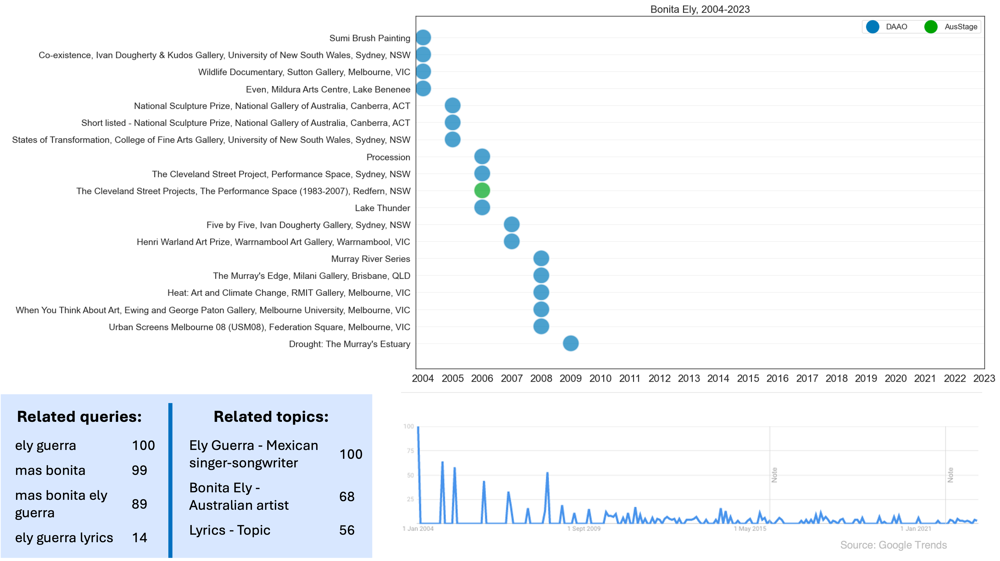

In [27]:
# fig, ax = plt.subplots(figsize=(16,10))
# sns.scatterplot(data=george_df[george_df['Start'] >= 2004].sort_values('Start'),
# x='Start', y='Event', 
# hue='Dataset', ax=ax, s=700, alpha=0.7, palette=['tab:blue','tab:green','tab:orange'])

# plt.legend(loc='lower left', fontsize=14, ncol=2, facecolor='white')
# # for i in range(6): plt.gca().get_legend().legendHandles[i]._sizes = [200]

# # make y-axis labels larger
# plt.yticks(fontsize=14); plt.xticks(fontsize=16)
# plt.ylabel(''); plt.xlabel('')

# # add y-axis grid
# plt.grid(axis='y', alpha=0.3)

# # add a title
# plt.title('Bonita Ely, 2004-2023' , fontsize=16)

# # # add annotation top right of plot to denote the vertical lines
# # plt.annotate('| = annual break', xy=(2006.5, -.5), fontsize=12, alpha=0.5)

# # move legend to specific location
# plt.legend(loc='upper right', fontsize=12, ncol=2, facecolor='white')
# for i in range(2): plt.gca().get_legend().legendHandles[i]._sizes = [400]

# # show each year on x-acis
# plt.xticks(np.arange(2004, 2024, 1))

# # increase y-axis limits to make room for the title
# plt.ylim(19.5, -1.25)

# plt.show()

Image(filename='images/Bonita_Trends.png')

### Maria Kozic

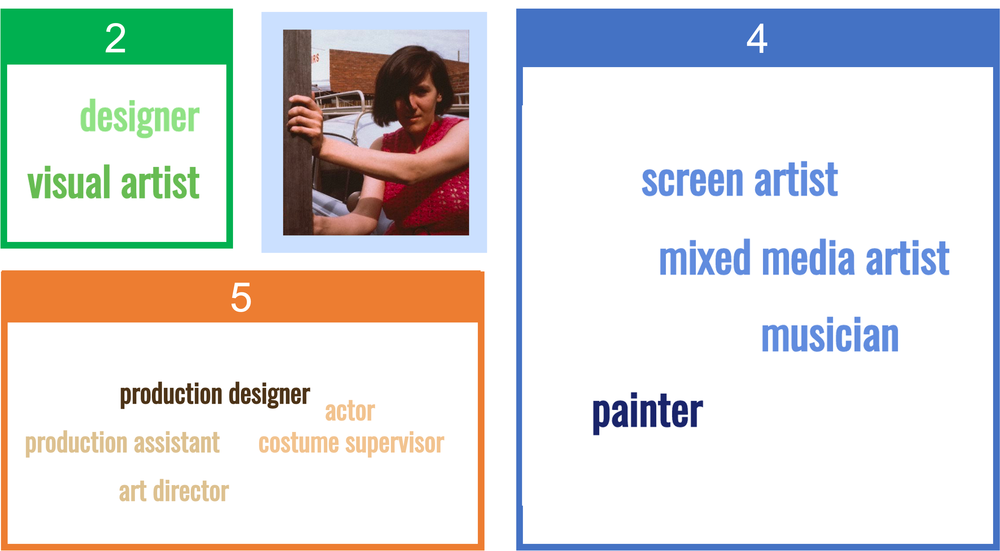

In [28]:
Image(filename='images/maria.png')

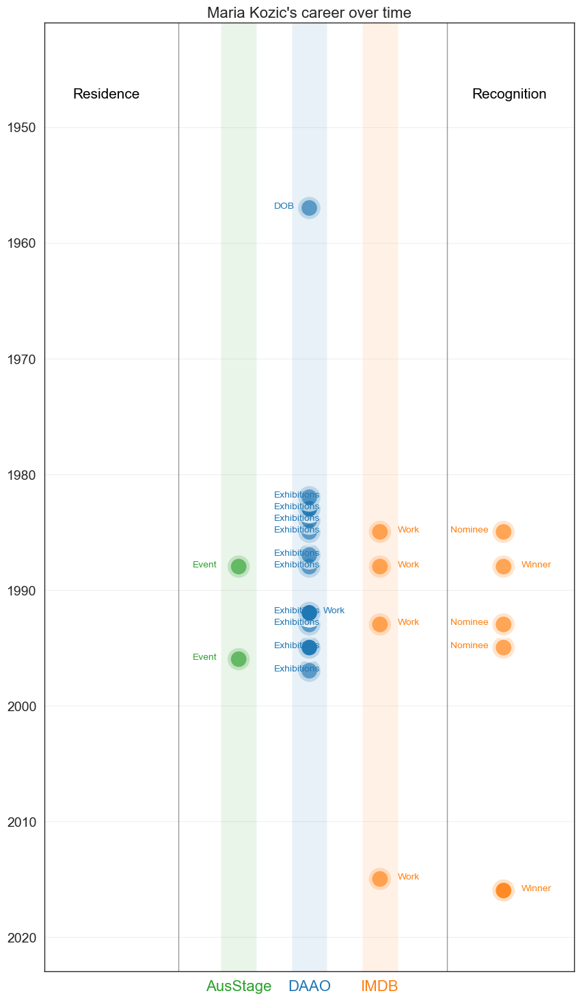

In [41]:
import warnings
warnings.filterwarnings('ignore')

george_df = pd.read_csv('data/selected4_events.csv')

# change values with birth date to 'Birth'
george_df['Type'] = np.where(george_df['Type'] == 'Birth date', 'DOB', george_df['Type'])
# george_df['Event'] = np.where(george_df['Event'] == 'Berlin, Germany', 'Berlin, \nGermany', george_df['Event'])

george_df = george_df[george_df.Person == 'Maria Kozic'] 
g1 = george_df.copy()

ausstage = george_df[george_df.Dataset == 'AusStage'].reset_index(drop=True)
daao = george_df[george_df.Dataset == 'DAAO'].reset_index(drop=True)
imdb = george_df[george_df.Dataset == 'IMDB'].reset_index(drop=True)

g1 = g1[g1.Type != 'Residence']
g1_awards = g1[(g1.Type == 'Recognition') | (g1.Type == 'Winner') | (g1.Type == 'Nominee')]
g1 = g1[g1.Type != 'Winner']
g1 = g1[g1.Type != 'Nominee']
g1 = g1[g1.Type != 'Recognition']

fig, ax = plt.subplots(figsize=(10,18))
sns.scatterplot(data=g1.sort_values(['Dataset'], ascending=[True]),
x='Dataset', y='Start', hue='Dataset', ax=ax, s=550, alpha=0.7, linewidth=7,
palette=['tab:green','tab:blue','tab:orange'], legend=False)

plt.scatter(data=g1[(g1.Country != 'Australia') & (~g1.Country.isnull())].sort_values(['Dataset'], ascending=[True]),
            x='Dataset',y='Start', marker='x', color='black', s=200, zorder=10)

# change x-axis labels to be different colors
for label in ax.get_xticklabels():
    dataset_label = label.get_text()
    if dataset_label == 'AusStage': label.set_color('tab:green')
    elif dataset_label == 'DAAO': label.set_color('tab:blue')
    elif dataset_label == 'IMDB': label.set_color('tab:orange')

sns.scatterplot(data=g1_awards[g1_awards.Type != 'Recognition'].sort_values(['Dataset'], ascending=[True]),
x=3.75, y='Start', hue='Dataset', ax=ax, s=550, alpha=0.7, palette=['tab:orange'], legend=True,linewidth=7)

sns.scatterplot(data=g1_awards[g1_awards.Type == 'Recognition'].sort_values(['Dataset'], ascending=[True]),
x=3.75, y='Start', hue='Dataset', ax=ax, s=550, alpha=0.7, palette=['tab:blue'], legend=True, linewidth=7)

plt.legend(loc='lower left', fontsize=14, ncol=2, facecolor='white')
# for i in range(6): plt.gca().get_legend().legendHandles[i]._sizes = [200]

# make y-axis labels larger
plt.yticks(fontsize=14); plt.xticks(fontsize=16)
plt.ylabel(''); plt.xlabel('')

# add y-axis grid
plt.grid(axis='y', alpha=0.3)

# add a title
plt.title("Maria Kozic's career over time" , fontsize=16)

# add higlighted rectangles centered at 0
plt.axvspan(-0.25, 0.25, facecolor='tab:green', alpha=0.1)
plt.axvspan(0.75, 1.25, facecolor='tab:blue', alpha=0.1)
plt.axvspan(1.75, 2.25, facecolor='tab:orange', alpha=0.1)


# add vertical line
# add a horizontal line  between the start and end of each person's career
for idx,p in enumerate(daao[daao['Type'] == 'Residence'].sort_values('Start')['Event'].unique()):
    start = daao[(daao['Event']==p)]['Start'].min()
    end = daao[(daao['Event']==p)]['End'].max()
    if (start==end) | (start+1==end): 
        
        sns.scatterplot(data=daao[daao['Event']==p].sort_values(['Start'], ascending=[True]),
        x=-2.2, y='Start',hue='Event', ax=ax, s=550, alpha=0.15, palette=['tab:blue'], legend=False)

        plt.scatter(data=daao[(daao['Event']==p) & (daao.Country != 'Australia') & (~daao.Country.isnull())].sort_values(['Start'], ascending=[True]),
            x=-2.2,y=2009, marker='x', color='black', s=200, zorder=10)
        
    else:
        if idx % 2 == 0: plt.plot([-2,-2], [start+0.4, end-0.4], linewidth=24, zorder=0, color = 'tab:blue', alpha=0.4)
        else: plt.plot([-2.2,-2.2], [start+0.4, end-0.4], linewidth=24, zorder=0, color = 'tab:blue', alpha=0.15)


# add annottation above the vertical line
plt.annotate('Residence', (-2.35, 1949-1.5), fontsize=15, alpha=1, color='black')


# add annottation above the vertical line
plt.annotate('Recognition', (3.3, 1949-1.5), fontsize=15, alpha=1, color='black')


# add text labels for each Residence event
for idx,p in enumerate(daao[daao['Type'] == 'Residence'].sort_values('Start')['Event'].unique()):
    start = daao[(daao['Event']==p)]['Start'].min()
    end = daao[(daao['Event']==p)]['End'].max()
    if (start==end) | (start+1==end): 
        ax.annotate(p, (-2.3, start), fontsize=10, alpha=1, color='tab:blue')
    else:
        if idx % 2 == 0: ax.annotate(p, (-2.3, (start+end)/2), fontsize=10, alpha=1, color='tab:blue')
        else: ax.annotate(p, (-2.3, (start+end)/2), fontsize=10, alpha=1, color='tab:blue')

daao = daao[daao.Type != 'Residence']

for idx,x in enumerate(ausstage['Type']):
    y = ausstage[ausstage.Type.str.contains(x)]['Start'][idx]
    ax.annotate(x, (-.65, y), fontsize=10, alpha=1, color='tab:green')

for idx,x in enumerate(daao['Type'].unique()):
    y = george_df[(george_df.Dataset == 'DAAO') & (george_df.Type.str.contains(x))]['Start'].unique()
    for y in george_df[(george_df.Dataset == 'DAAO') & (george_df.Type.str.contains(x))]['Start'].unique():
        z = george_df[(george_df.Dataset == 'DAAO') & (george_df.Type.str.contains(x)) & (george_df.Start == y)]['Start'].iloc[0]
        if (x == 'Recognition'): ax.annotate(x, (3.95, z), fontsize=10, alpha=1, color='tab:blue')
        else:
            if idx % 2 == 0: ax.annotate(x, (0.5, z), fontsize=10, alpha=1, color='tab:blue')
            else: ax.annotate(x, (1.2, z), fontsize=10, alpha=1, color='tab:blue')

for idx,x in enumerate(imdb['Type'].unique()):
    y = george_df[(george_df.Dataset == 'IMDB') & (george_df.Type.str.contains(x))]['Start'].unique()
    for y in george_df[(george_df.Dataset == 'IMDB') & (george_df.Type.str.contains(x))]['Start'].unique():
        z = george_df[(george_df.Dataset == 'IMDB') & (george_df.Type.str.contains(x)) & (george_df.Start == y)]['Start'].iloc[0]
        if (x == 'Nominee'): ax.annotate(x, (3, z), fontsize=10, alpha=1, color='tab:orange')
        elif (x == 'Winner'): ax.annotate(x, (4, z), fontsize=10, alpha=1, color='tab:orange')
        else:
            ax.annotate(x, (2.25, z), fontsize=10, alpha=1, color='tab:orange')

plt.ylim(1941,2023)

# change the order of the y-axis
plt.gca().invert_yaxis()

# add more space between the x-axis ticks
plt.xticks(np.arange(0, 10, 1))

# move legend to specific location
# plt.legend(loc='upper right', fontsize=12, ncol=1, facecolor='white', bbox_to_anchor=(0.965, 0.97))
# for i in range(2): plt.gca().get_legend().legendHandles[i]._sizes = [200]

# remove the legend
plt.legend().remove()

# add vertical lines on 0,1,2
plt.axvline(x=-.85, color='black', alpha=0.4, linestyle='-', linewidth=1)
plt.axvline(x=2.95, color='black', alpha=0.4, linestyle='-', linewidth=1)
# plt.axvline(x=0, color='lightgrey', alpha=0.4, linestyle='-', linewidth=1)
# plt.axvline(x=1, color='lightgrey', alpha=0.4, linestyle='-', linewidth=1)
# plt.axvline(x=2, color='lightgrey', alpha=0.4, linestyle='-', linewidth=1)

# # add annotation top right of plot to denote the vertical lines
# plt.annotate('| = annual break', xy=(2006.5, -.5), fontsize=12, alpha=0.5)

#remove y-axis title
plt.ylabel('')

# increase y-axis limits to make room for the title
plt.xlim(-2.75, 4.75)
plt.show()


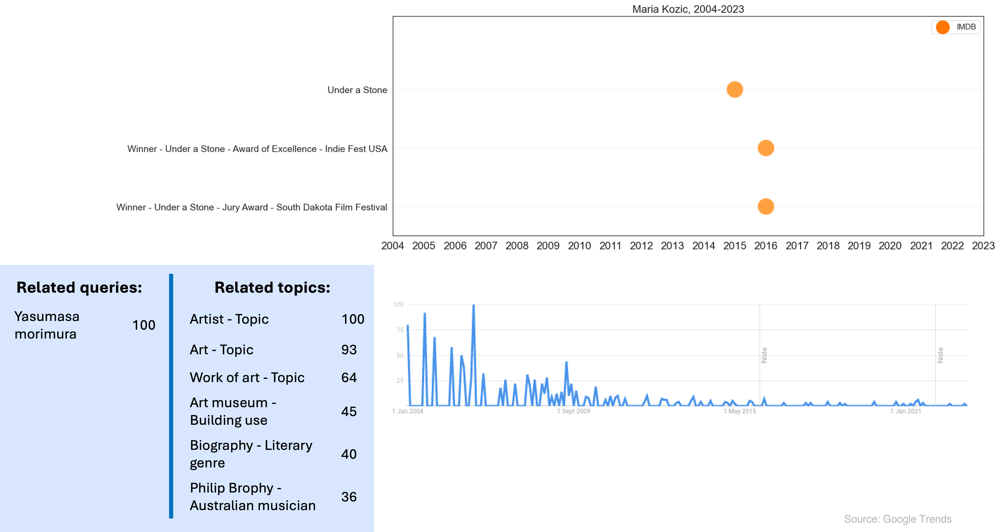

In [31]:
# fig, ax = plt.subplots(figsize=(16,6))
# sns.scatterplot(data=george_df[george_df['Start'] >= 2004].sort_values('Start'),
# x='Start', y='Event', 
# hue='Dataset', ax=ax, s=700, alpha=0.7, palette=['tab:orange','tab:green','tab:orange'])

# plt.legend(loc='lower left', fontsize=14, ncol=2, facecolor='white')
# # for i in range(6): plt.gca().get_legend().legendHandles[i]._sizes = [200]

# # make y-axis labels larger
# plt.yticks(fontsize=14); plt.xticks(fontsize=16)
# plt.ylabel(''); plt.xlabel('')

# # add y-axis grid
# plt.grid(axis='y', alpha=0.3)

# # add a title
# plt.title('Maria Kozic, 2004-2023' , fontsize=16)

# # # add annotation top right of plot to denote the vertical lines
# # plt.annotate('| = annual break', xy=(2006.5, -.5), fontsize=12, alpha=0.5)

# # move legend to specific location
# plt.legend(loc='upper right', fontsize=12, ncol=2, facecolor='white')
# for i in range(1): plt.gca().get_legend().legendHandles[i]._sizes = [400]

# # show each year on x-acis
# plt.xticks(np.arange(2004, 2024, 1))

# # increase y-axis limits to make room for the title
# plt.ylim(2.5, -1.25)

# plt.show()

Image(filename='images/Maria_Trends.png')

### Toni Maticevski

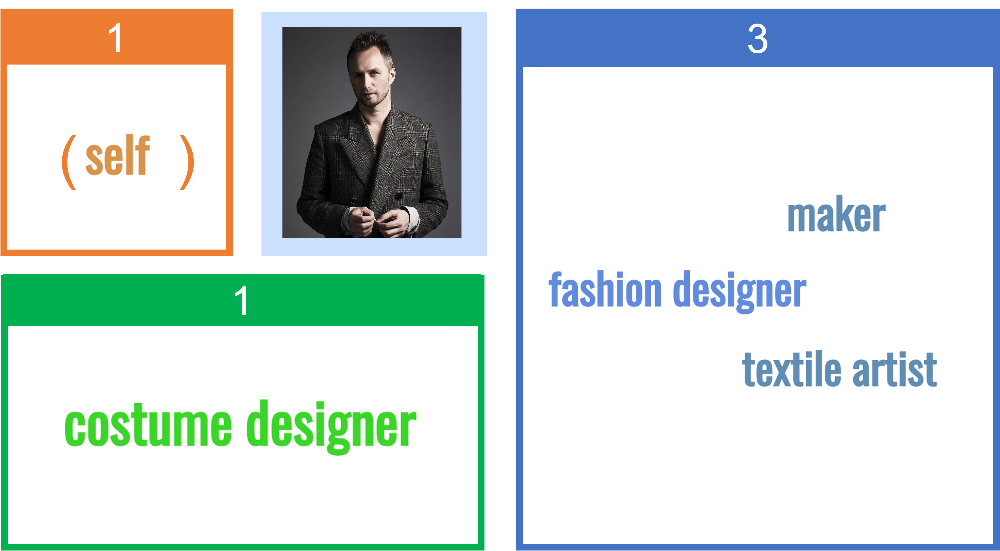

In [32]:
Image(filename='images/Toni.png')

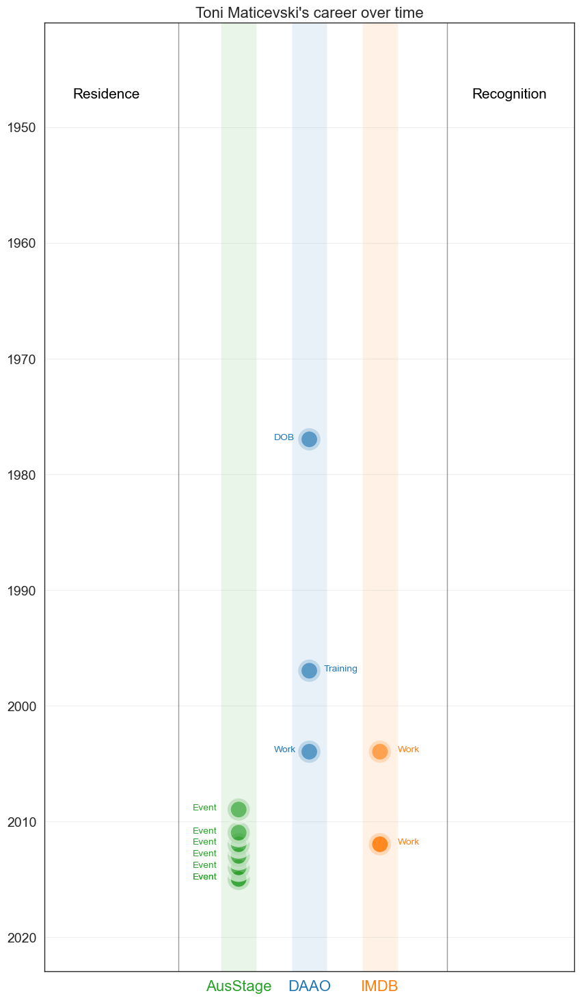

In [42]:
import warnings
warnings.filterwarnings('ignore')

george_df = pd.read_csv('data/selected4_events.csv')

# change values with birth date to 'Birth'
george_df['Type'] = np.where(george_df['Type'] == 'Birth date', 'DOB', george_df['Type'])
# george_df['Event'] = np.where(george_df['Event'] == 'Berlin, Germany', 'Berlin, \nGermany', george_df['Event'])

george_df = george_df[george_df.Person == 'Toni Maticevski'] 
g1 = george_df.copy()

ausstage = george_df[george_df.Dataset == 'AusStage'].reset_index(drop=True)
daao = george_df[george_df.Dataset == 'DAAO'].reset_index(drop=True)
imdb = george_df[george_df.Dataset == 'IMDB'].reset_index(drop=True)

g1 = g1[g1.Type != 'Residence']
g1_awards = g1[(g1.Type == 'Recognition') | (g1.Type == 'Winner') | (g1.Type == 'Nominee')]
g1 = g1[g1.Type != 'Winner']
g1 = g1[g1.Type != 'Nominee']
g1 = g1[g1.Type != 'Recognition']

fig, ax = plt.subplots(figsize=(10,18))
sns.scatterplot(data=g1.sort_values(['Dataset'], ascending=[True]),
x='Dataset', y='Start', hue='Dataset', ax=ax, s=550, alpha=0.7, linewidth=7,
palette=['tab:green','tab:blue','tab:orange'], legend=False)

plt.scatter(data=g1[(g1.Country != 'Australia') & (~g1.Country.isnull())].sort_values(['Dataset'], ascending=[True]),
            x='Dataset',y='Start', marker='x', color='black', s=200, zorder=10)

# change x-axis labels to be different colors
for label in ax.get_xticklabels():
    dataset_label = label.get_text()
    if dataset_label == 'AusStage': label.set_color('tab:green')
    elif dataset_label == 'DAAO': label.set_color('tab:blue')
    elif dataset_label == 'IMDB': label.set_color('tab:orange')

sns.scatterplot(data=g1_awards[g1_awards.Type != 'Recognition'].sort_values(['Dataset'], ascending=[True]),
x=3.75, y='Start', hue='Dataset', ax=ax, s=550, alpha=0.7, palette=['tab:orange'], legend=True,linewidth=7)

sns.scatterplot(data=g1_awards[g1_awards.Type == 'Recognition'].sort_values(['Dataset'], ascending=[True]),
x=3.75, y='Start', hue='Dataset', ax=ax, s=550, alpha=0.7, palette=['tab:blue'], legend=True, linewidth=7)

plt.legend(loc='lower left', fontsize=14, ncol=2, facecolor='white')
# for i in range(6): plt.gca().get_legend().legendHandles[i]._sizes = [200]

# make y-axis labels larger
plt.yticks(fontsize=14); plt.xticks(fontsize=16)
plt.ylabel(''); plt.xlabel('')

# add y-axis grid
plt.grid(axis='y', alpha=0.3)

# add a title
plt.title("Toni Maticevski's career over time" , fontsize=16)

# add higlighted rectangles centered at 0
plt.axvspan(-0.25, 0.25, facecolor='tab:green', alpha=0.1)
plt.axvspan(0.75, 1.25, facecolor='tab:blue', alpha=0.1)
plt.axvspan(1.75, 2.25, facecolor='tab:orange', alpha=0.1)


# add vertical line
# add a horizontal line  between the start and end of each person's career
for idx,p in enumerate(daao[daao['Type'] == 'Residence'].sort_values('Start')['Event'].unique()):
    start = daao[(daao['Event']==p)]['Start'].min()
    end = daao[(daao['Event']==p)]['End'].max()
    if (start==end) | (start+1==end): 
        
        sns.scatterplot(data=daao[daao['Event']==p].sort_values(['Start'], ascending=[True]),
        x=-2.2, y='Start',hue='Event', ax=ax, s=550, alpha=0.15, palette=['tab:blue'], legend=False)

        plt.scatter(data=daao[(daao['Event']==p) & (daao.Country != 'Australia') & (~daao.Country.isnull())].sort_values(['Start'], ascending=[True]),
            x=-2.2,y=2009, marker='x', color='black', s=200, zorder=10)
        
    else:
        if idx % 2 == 0: plt.plot([-2,-2], [start+0.4, end-0.4], linewidth=24, zorder=0, color = 'tab:blue', alpha=0.4)
        else: plt.plot([-2.2,-2.2], [start+0.4, end-0.4], linewidth=24, zorder=0, color = 'tab:blue', alpha=0.15)


# add annottation above the vertical line
plt.annotate('Residence', (-2.35, 1949-1.5), fontsize=15, alpha=1, color='black')


# add annottation above the vertical line
plt.annotate('Recognition', (3.3, 1949-1.5), fontsize=15, alpha=1, color='black')


# add text labels for each Residence event
for idx,p in enumerate(daao[daao['Type'] == 'Residence'].sort_values('Start')['Event'].unique()):
    start = daao[(daao['Event']==p)]['Start'].min()
    end = daao[(daao['Event']==p)]['End'].max()
    if (start==end) | (start+1==end): 
        ax.annotate(p, (-2.3, start), fontsize=10, alpha=1, color='tab:blue')
    else:
        if idx % 2 == 0: ax.annotate(p, (-2.3, (start+end)/2), fontsize=10, alpha=1, color='tab:blue')
        else: ax.annotate(p, (-2.3, (start+end)/2), fontsize=10, alpha=1, color='tab:blue')

daao = daao[daao.Type != 'Residence']

for idx,x in enumerate(ausstage['Type']):
    y = ausstage[ausstage.Type.str.contains(x)]['Start'][idx]
    ax.annotate(x, (-.65, y), fontsize=10, alpha=1, color='tab:green')

for idx,x in enumerate(daao['Type'].unique()):
    y = george_df[(george_df.Dataset == 'DAAO') & (george_df.Type.str.contains(x))]['Start'].unique()
    for y in george_df[(george_df.Dataset == 'DAAO') & (george_df.Type.str.contains(x))]['Start'].unique():
        z = george_df[(george_df.Dataset == 'DAAO') & (george_df.Type.str.contains(x)) & (george_df.Start == y)]['Start'].iloc[0]
        if (x == 'Recognition'): ax.annotate(x, (3.95, z), fontsize=10, alpha=1, color='tab:blue')
        else:
            if idx % 2 == 0: ax.annotate(x, (0.5, z), fontsize=10, alpha=1, color='tab:blue')
            else: ax.annotate(x, (1.2, z), fontsize=10, alpha=1, color='tab:blue')

for idx,x in enumerate(imdb['Type'].unique()):
    y = george_df[(george_df.Dataset == 'IMDB') & (george_df.Type.str.contains(x))]['Start'].unique()
    for y in george_df[(george_df.Dataset == 'IMDB') & (george_df.Type.str.contains(x))]['Start'].unique():
        z = george_df[(george_df.Dataset == 'IMDB') & (george_df.Type.str.contains(x)) & (george_df.Start == y)]['Start'].iloc[0]
        if (x == 'Nominee'): ax.annotate(x, (3, z), fontsize=10, alpha=1, color='tab:orange')
        elif (x == 'Winner'): ax.annotate(x, (4, z), fontsize=10, alpha=1, color='tab:orange')
        else:
            ax.annotate(x, (2.25, z), fontsize=10, alpha=1, color='tab:orange')

plt.ylim(1941,2023)

# change the order of the y-axis
plt.gca().invert_yaxis()

# add more space between the x-axis ticks
plt.xticks(np.arange(0, 10, 1))

# move legend to specific location
# plt.legend(loc='upper right', fontsize=12, ncol=1, facecolor='white', bbox_to_anchor=(0.965, 0.97))
# for i in range(2): plt.gca().get_legend().legendHandles[i]._sizes = [200]

# remove the legend
plt.legend().remove()

# add vertical lines on 0,1,2
plt.axvline(x=-.85, color='black', alpha=0.4, linestyle='-', linewidth=1)
plt.axvline(x=2.95, color='black', alpha=0.4, linestyle='-', linewidth=1)
# plt.axvline(x=0, color='lightgrey', alpha=0.4, linestyle='-', linewidth=1)
# plt.axvline(x=1, color='lightgrey', alpha=0.4, linestyle='-', linewidth=1)
# plt.axvline(x=2, color='lightgrey', alpha=0.4, linestyle='-', linewidth=1)

# # add annotation top right of plot to denote the vertical lines
# plt.annotate('| = annual break', xy=(2006.5, -.5), fontsize=12, alpha=0.5)

#remove y-axis title
plt.ylabel('')

# increase y-axis limits to make room for the title
plt.xlim(-2.75, 4.75)
plt.show()


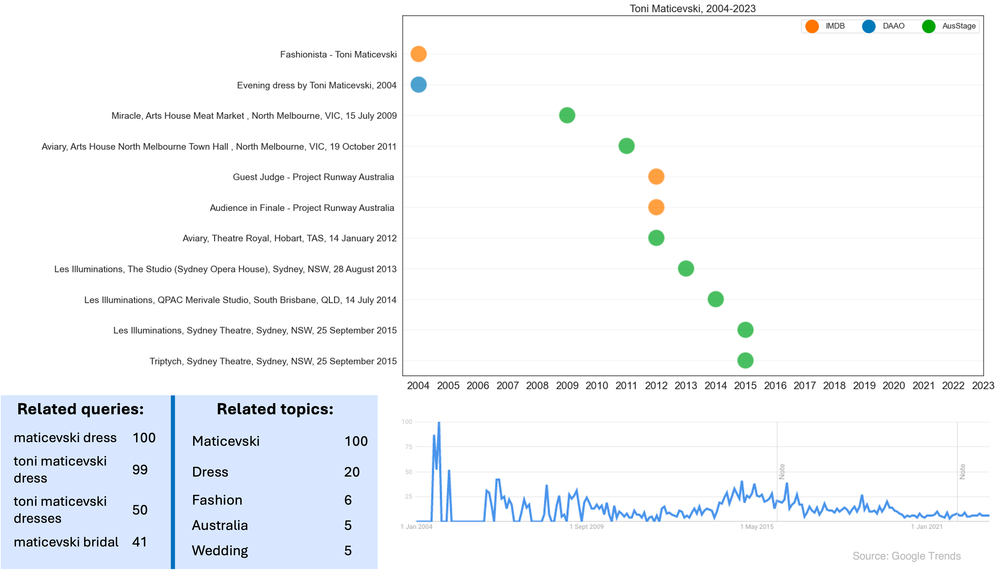

In [34]:
# fig, ax = plt.subplots(figsize=(16,10))
# sns.scatterplot(data=george_df[george_df['Start'] >= 2004].sort_values('Start'),
# x='Start', y='Event', 
# hue='Dataset', ax=ax, s=700, alpha=0.7, palette=['tab:orange','tab:blue','tab:green'])

# plt.legend(loc='lower left', fontsize=14, ncol=2, facecolor='white')
# # for i in range(6): plt.gca().get_legend().legendHandles[i]._sizes = [200]

# # make y-axis labels larger
# plt.yticks(fontsize=14); plt.xticks(fontsize=16)
# plt.ylabel(''); plt.xlabel('')

# # add y-axis grid
# plt.grid(axis='y', alpha=0.3)

# # add a title
# plt.title('Toni Maticevski, 2004-2023' , fontsize=16)

# # # add annotation top right of plot to denote the vertical lines
# # plt.annotate('| = annual break', xy=(2006.5, -.5), fontsize=12, alpha=0.5)

# # move legend to specific location
# plt.legend(loc='upper right', fontsize=12, ncol=3, facecolor='white')
# for i in range(3): plt.gca().get_legend().legendHandles[i]._sizes = [400]

# # show each year on x-acis
# plt.xticks(np.arange(2004, 2024, 1))

# # increase y-axis limits to make room for the title
# plt.ylim(10.5, -1.25)

# plt.show()

Image(filename='images/Toni_Trends.png')

### Number of relations in AusStage

In [36]:
df_bio = pd.read_csv('data/AusStage_biography_level_202209211051.csv', low_memory=False)
df2 = pd.read_csv('data/AusStage_network_level_202205122052.csv', low_memory=False)

# George Gittoes
print('George Gittoes: ',
df_bio[df_bio['original_id']\
       .isin(df2[df2['node2_value']\
                 .isin(df2[(df2['node1_value'] == 234780) &\
                           (df2['node1_name'] == 'CONTRIBUTORID')]['node2_value']\
                       .unique())]['node1_value']\
                        .unique())]['display_name'].nunique()-1)

# Bonita Ely
print('\nBonita Ely: ',
df_bio[df_bio['original_id']\
       .isin(df2[df2['node2_value']\
                 .isin(df2[(df2['node1_value'] == 421214) &\
                           (df2['node1_name'] == 'CONTRIBUTORID')]['node2_value']\
                       .unique())]['node1_value']\
                        .unique())]['display_name'].nunique()-1)

# Maria Kozic
print('\nMaria Kozic: ',
df_bio[df_bio['original_id']\
       .isin(df2[df2['node2_value']\
                 .isin(df2[(df2['node1_value'] == 255225) &\
                           (df2['node1_name'] == 'CONTRIBUTORID')]['node2_value']\
                       .unique())]['node1_value']\
                        .unique())]['display_name'].nunique()-1)

# Toni Maticevski
print('\nToni Maticevski: ',
df_bio[df_bio['original_id']\
       .isin(df2[df2['node2_value']\
                 .isin(df2[(df2['node1_value'] == 450108) &\
                           (df2['node1_name'] == 'CONTRIBUTORID')]['node2_value']\
                       .unique())]['node1_value']\
                        .unique())]['display_name'].nunique()-1)

print('\nTotal: 110')

George Gittoes:  36

Bonita Ely:  37

Maria Kozic:  14

Toni Maticevski:  23

Total: 110


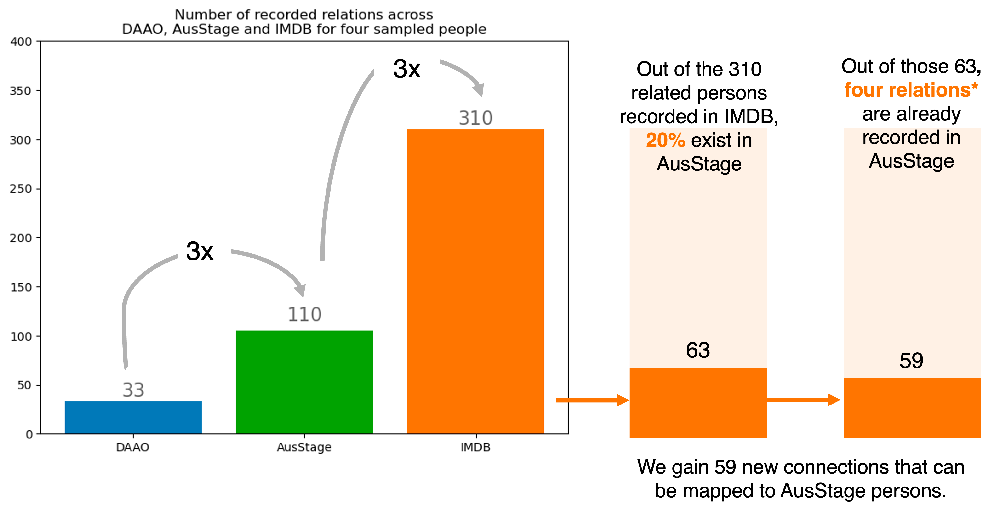

In [39]:
# imdb_persons = pd.read_csv('data/imdb_persons.csv',index_col=0)
# imdb_persons = imdb_persons.drop_duplicates()

# # imdb_persons = imdb_persons.reset_index()
# # imdb_persons['SamePerson'] = np.where(imdb_persons['Person'] == imdb_persons['Relation'], 1, 0)
# # pd.merge(imdb_persons[(imdb_persons['Dataset'] == 'IMDB') &\
# #                       (imdb_persons['SamePerson']!=1)], 
# #                       df_bio, 
# #          left_on='Relation', right_on='display_name', how='inner')[['Person','Relation']]\
# #             .drop_duplicates().to_csv('data/people63.csv', index=False)

# # set figure size
# plt.figure(figsize=(8,6))

# plt.bar([1,2,3], [33,105,310], color=['tab:blue','tab:green','tab:orange'])

# # add data labels on top of bars
# for i, v in enumerate([33,110,310]):
#     plt.text(i+1, v+5, str(v), color='black', alpha=0.6, size=16, ha='center')

# # change x-axis labels to 'A', 'B' and 'C'
# plt.xticks([1,2,3], ['DAAO','AusStage','IMDB'])

# plt.title('Number of recorded relations across\nDAAO, AusStage and IMDB for four sampled people', size=12)

# # increase y-axis limit to 200
# plt.ylim(0,400)

# plt.show()

Image(filename='images/AusStagerelations.png')

### Number of events for each case study

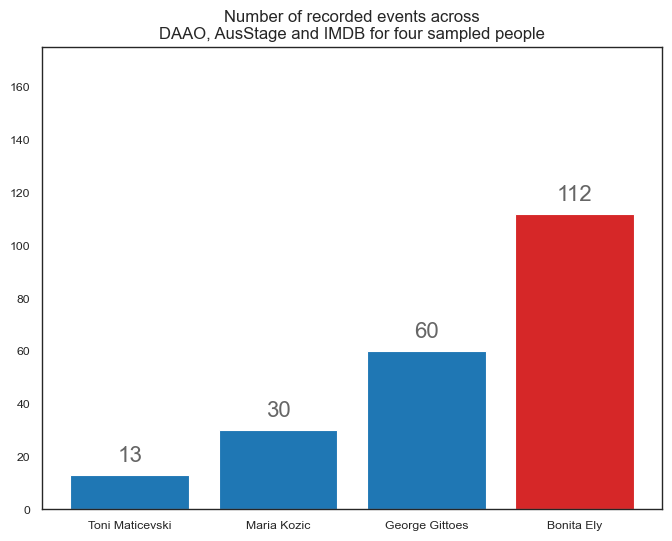

In [ ]:
# generate a bar chart with the values 26, 34 and 100
import matplotlib.pyplot as plt
plt.figure(figsize=(8,6))
plt.bar([1,2,3,4], [13,30,60,112], color=['tab:blue','tab:blue','tab:blue','tab:red'])

# add data labels on top of bars
for i, v in enumerate([13,30,60,112]):
    plt.text(i+1, v+5, str(v), color='black', alpha=0.6, size=16, ha='center')

# change x-axis labels to 'A', 'B' and 'C'
plt.xticks([1,2,3,4], ['Toni Maticevski','Maria Kozic','George Gittoes','Bonita Ely'])

plt.title('Number of recorded events across\nDAAO, AusStage and IMDB for four sampled people', size=12)

# increase y-axis limit to 200
plt.ylim(0,175)

plt.show()